In [1]:
#function --> class ---> module --> package

import requests

In [2]:
import matplotlib.pyplot as plt

In [3]:
from PIL import Image

In [4]:
from io import BytesIO

In [5]:
import json

In [6]:
subscription_key = 'ad364518d66a4df09b7a510a85e42cbc'

In [7]:
vision_base_url = 'https://daegu0001.cognitiveservices.azure.com/vision/v2.0/'

In [8]:
analyze_url = vision_base_url + 'analyze'

In [9]:
image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/1/12/" + \
"Broadway_and_Times_Square_by_night.jpg/450px-Broadway_and_Times_Square_by_night.jpg"

In [10]:
image = Image.open(BytesIO(requests.get(image_url).content))

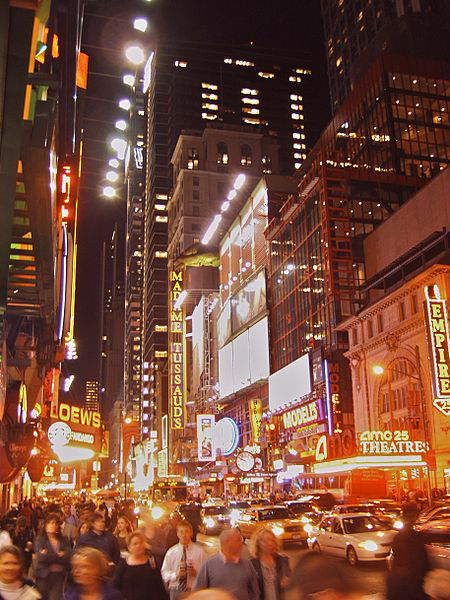

In [11]:
image

## 헤더 정보를 셋팅합니다.

In [12]:
headers = {'Ocp-Apim-Subscription-Key' : subscription_key}
params = {'visualFeature' : 'Cartegories, Description. Color'}
data = {'url' : image_url}

In [28]:
response = requests.post(analyze_url, headers = headers, params = params, json = data)
response.raise_for_status()

In [29]:
analysis = response.json()

In [34]:
analysis

{'categories': [{'name': 'outdoor_street', 'score': 0.5546875}],
 'requestId': '8c132698-5d53-4247-9643-00b69dc76939',
 'metadata': {'height': 1365, 'width': 2048, 'format': 'Jpeg'}}

In [35]:
image_caption = analysis['description']['captions'][0]['text'].capitalize()

KeyError: 'description'

## Object Detection

In [16]:
objectDetection_url = vision_base_url + 'detect'

In [17]:
image_url = 'https://static01.nyt.com/images/2019/10/03/nyregion/03nytoday1/merlin_162008868_5a82355f-1be5-4ddb-b562-a6cd7b776a43-superJumbo.jpg?quality=90&auto=webp'

In [18]:
image = Image.open(BytesIO(requests.get(image_url).content))

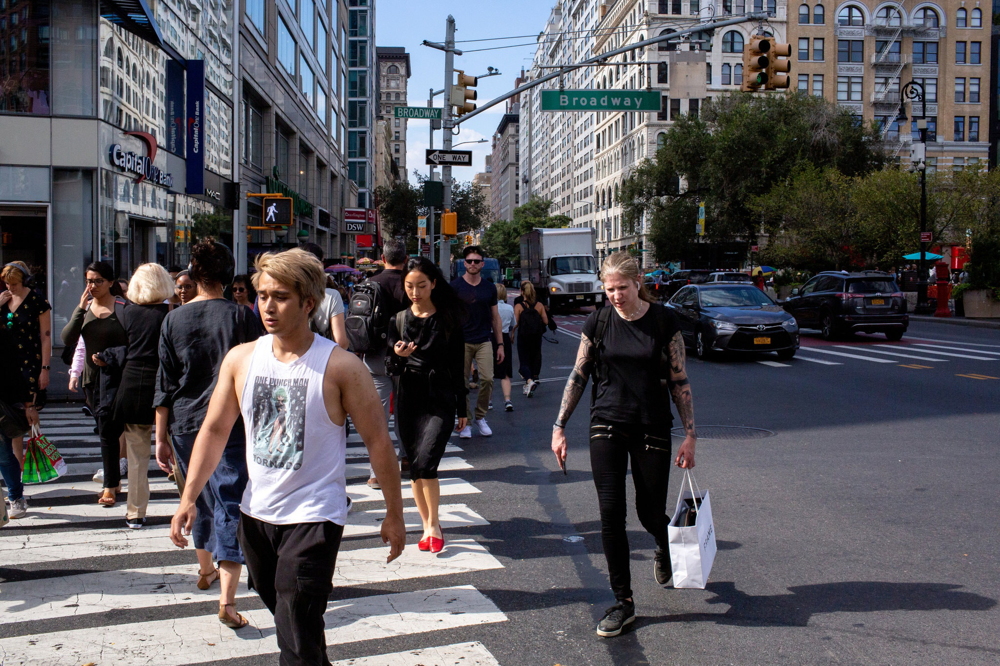

In [19]:
image

In [20]:
headers = {'Ocp-Apim-Subscription-Key' : subscription_key}
data = {'url' : image_url}

In [21]:
response = requests.post(objectDetection_url, headers = headers, json = data)

In [22]:
detectionResult = response.json()

In [23]:
detectionResult

{'objects': [{'rectangle': {'x': 1370, 'y': 570, 'w': 245, 'h': 166},
   'object': 'car',
   'confidence': 0.695,
   'parent': {'object': 'Land vehicle',
    'confidence': 0.745,
    'parent': {'object': 'Vehicle', 'confidence': 0.746}}},
  {'rectangle': {'x': 1617, 'y': 569, 'w': 228, 'h': 128},
   'object': 'car',
   'confidence': 0.685,
   'parent': {'object': 'Land vehicle',
    'confidence': 0.742,
    'parent': {'object': 'Vehicle', 'confidence': 0.742}}},
  {'rectangle': {'x': 151, 'y': 540, 'w': 156, 'h': 526},
   'object': 'person',
   'confidence': 0.762},
  {'rectangle': {'x': 751, 'y': 549, 'w': 202, 'h': 565},
   'object': 'person',
   'confidence': 0.812},
  {'rectangle': {'x': 343, 'y': 522, 'w': 211, 'h': 754},
   'object': 'person',
   'confidence': 0.77},
  {'rectangle': {'x': 384, 'y': 518, 'w': 432, 'h': 809},
   'object': 'person',
   'confidence': 0.829},
  {'rectangle': {'x': 1144, 'y': 491, 'w': 291, 'h': 806},
   'object': 'person',
   'confidence': 0.917}],
 '

In [24]:
from PIL import Image, ImageDraw, ImageFont

In [25]:
draw = ImageDraw.Draw(image)

In [38]:
def CreateImage(dectectionResult):
    
    objects = detectionResult['objects']
    
    for obj in objects:
        
        rect = obj['rectangle']
        
        x = rect['x']
        y = rect['y']
        w = rect['w']
        h = rect['h']
        
        draw.rectangle(((x, y), (x + w, y + h)), outline = 'red')
        
        
        

In [39]:
CreateImage(detectionResult)

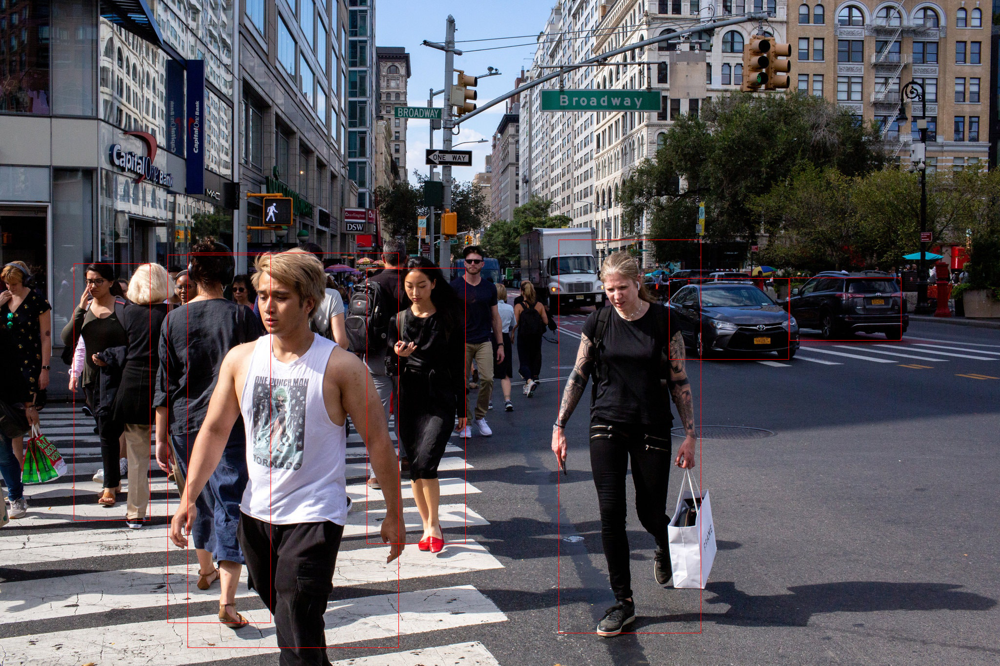

In [40]:
image